Importing libraries


In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from imblearn.over_sampling import SVMSMOTE
from sklearn.model_selection import train_test_split,learning_curve,GridSearchCV,RandomizedSearchCV,cross_val_score
from sklearn.metrics import f1_score, precision_score, recall_score, accuracy_score,silhouette_score,ConfusionMatrixDisplay,classification_report,roc_auc_score,roc_curve,precision_recall_curve,confusion_matrix
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
import xgboost as xgb
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import MinMaxScaler,StandardScaler,LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import LocalOutlierFactor,NearestNeighbors,KNeighborsClassifier
from sklearn.cluster import KMeans,AgglomerativeClustering,DBSCAN
from yellowbrick.cluster import KElbowVisualizer
import plotly.graph_objs as go
import plotly as py
import plotly.io as pio
import plotly.figure_factory as ff
import plotly.express as px
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
import gradio as gr
import scipy.cluster.hierarchy as shc
import graphviz
import time
import warnings
import pickle

init_notebook_mode(connected=True)
warnings.filterwarnings('ignore')

Reading File

In [2]:
file="NEV_fault_dataset.csv"
data=pd.read_csv(file)
df=pd.DataFrame(data)
print(df.columns)
print(df.head(10))

Index(['Voltage (V)', 'Current (A)', 'Motor Speed (RPM)', 'Temperature (°C)',
       'Vibration (g)', 'Ambient Temp (°C)', 'Humidity (%)', 'Fault Label'],
      dtype='object')
   Voltage (V)  Current (A)  Motor Speed (RPM)  Temperature (°C)  \
0     0.938922     0.199535           0.544403          0.239508   
1     0.804854     0.597188           0.073416          0.180373   
2     0.949877     0.426896           0.083007          0.251436   
3     0.954370     0.121175           0.962771          0.377942   
4     0.810464     0.382501           0.557223          0.048694   
5     0.966576     0.240262           0.090658          0.404720   
6     0.838215     0.307813           0.235458          0.426176   
7     0.764625     0.391854           0.207051          0.442758   
8     0.813038     0.224443           0.522568          0.090734   
9     0.586442     0.275392           0.354517          0.397816   

   Vibration (g)  Ambient Temp (°C)  Humidity (%)  Fault Label  
0       0

In [3]:
df.describe()

,Voltage (V),Current (A),Motor Speed (RPM),Temperature (°C),Vibration (g),Ambient Temp (°C),Humidity (%),Fault Label
count,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000,11000.000000
mean,0.728576,0.431700,0.443010,0.380225,0.281481,0.495347,0.500356,1.090909
std,0.224415,0.245215,0.256147,0.229912,0.240546,0.286040,0.290172,1.164257
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.612900,0.237031,0.229121,0.197145,0.109902,0.249639,0.246695,0.000000
50%,0.797613,0.396222,0.413228,0.370151,0.217818,0.490943,0.503985,1.000000
75%,0.891521,0.604094,0.640606,0.520455,0.345722,0.743677,0.749887,2.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11000 entries, 0 to 10999
Data columns (total 8 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Voltage (V)        11000 non-null  float64
 1   Current (A)        11000 non-null  float64
 2   Motor Speed (RPM)  11000 non-null  float64
 3   Temperature (°C)   11000 non-null  float64
 4   Vibration (g)      11000 non-null  float64
 5   Ambient Temp (°C)  11000 non-null  float64
 6   Humidity (%)       11000 non-null  float64
 7   Fault Label        11000 non-null  float64
dtypes: float64(8)
memory usage: 687.6 KB


In [5]:
df.duplicated().sum()

np.int64(0)

Data Pre-Processing

In [6]:
df.columns

Index(['Voltage (V)', 'Current (A)', 'Motor Speed (RPM)', 'Temperature (°C)',
       'Vibration (g)', 'Ambient Temp (°C)', 'Humidity (%)', 'Fault Label'],
      dtype='object')

In [7]:
df.rename(mapper={'Voltage (V)':'Voltage', 'Current (A)':'Current', 'Motor Speed (RPM)':'Motor_Speed', 'Temperature (°C)':'Temperature',
       'Vibration (g)':'Vibration', 'Ambient Temp (°C)':'Ambient_Temp', 'Humidity (%)':'Humidity', 'Fault Label':'Fault_Label'},axis=1,inplace=True)

In [8]:
df.head()

,Voltage,Current,Motor_Speed,Temperature,Vibration,Ambient_Temp,Humidity,Fault_Label
0,0.938922,0.199535,0.544403,0.239508,0.301284,0.582435,0.397340,0.0
1,0.804854,0.597188,0.073416,0.180373,0.920876,0.128203,0.124523,1.0
2,0.949877,0.426896,0.083007,0.251436,0.610996,0.714957,0.003283,1.0
3,0.954370,0.121175,0.962771,0.377942,0.070619,0.776723,0.502552,0.0
4,0.810464,0.382501,0.557223,0.048694,0.078834,0.326350,0.168493,0.0


In [9]:
df['Power']=df['Voltage']*df['Current'] 


In [10]:
df.columns

Index(['Voltage', 'Current', 'Motor_Speed', 'Temperature', 'Vibration',
       'Ambient_Temp', 'Humidity', 'Fault_Label', 'Power'],
      dtype='object')

In [11]:
df.head()

,Voltage,Current,Motor_Speed,Temperature,Vibration,Ambient_Temp,Humidity,Fault_Label,Power
0,0.938922,0.199535,0.544403,0.239508,0.301284,0.582435,0.397340,0.0,0.187348
1,0.804854,0.597188,0.073416,0.180373,0.920876,0.128203,0.124523,1.0,0.480650
2,0.949877,0.426896,0.083007,0.251436,0.610996,0.714957,0.003283,1.0,0.405499
3,0.954370,0.121175,0.962771,0.377942,0.070619,0.776723,0.502552,0.0,0.115646
4,0.810464,0.382501,0.557223,0.048694,0.078834,0.326350,0.168493,0.0,0.310004


In [12]:
df['Fault']=df['Fault_Label'].apply(lambda x:0 if x==0.0 else 1)

In [13]:
df=df[['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature', 'Vibration', 'Ambient_Temp', 'Humidity','Fault','Fault_Label']]

In [14]:
df.head()

,Voltage,Current,Power,Motor_Speed,Temperature,Vibration,Ambient_Temp,Humidity,Fault,Fault_Label
0,0.938922,0.199535,0.187348,0.544403,0.239508,0.301284,0.582435,0.397340,0,0.0
1,0.804854,0.597188,0.480650,0.073416,0.180373,0.920876,0.128203,0.124523,1,1.0
2,0.949877,0.426896,0.405499,0.083007,0.251436,0.610996,0.714957,0.003283,1,1.0
3,0.954370,0.121175,0.115646,0.962771,0.377942,0.070619,0.776723,0.502552,0,0.0
4,0.810464,0.382501,0.310004,0.557223,0.048694,0.078834,0.326350,0.168493,0,0.0


Plotting Graphics

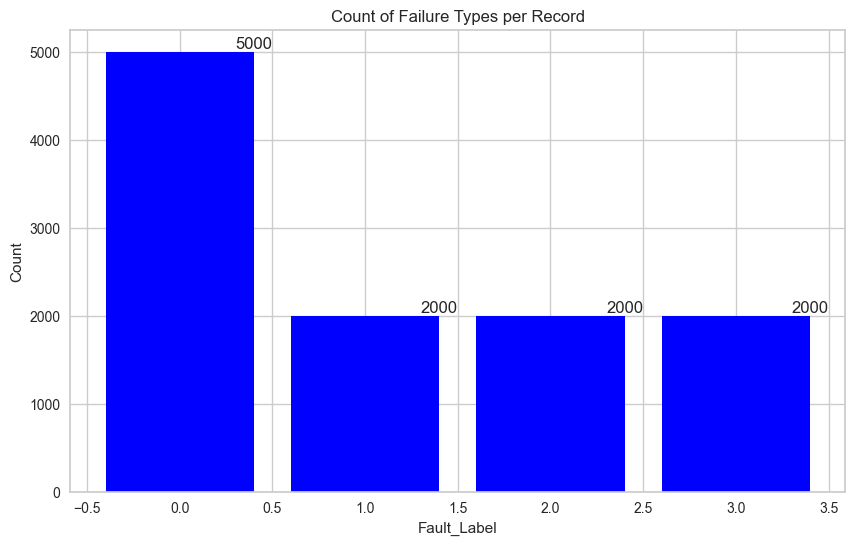

In [15]:
grouped = df['Fault_Label'].value_counts().reset_index()
grouped.columns = ['Fault_Label', 'Count']

plt.figure(figsize=(10, 6))
bars = plt.bar(grouped['Fault_Label'], grouped['Count'], color='blue')

for bar, count in zip(bars, grouped['Count']):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width(), yval + 0.5, count, ha='center', va='bottom')

plt.xlabel('Fault_Label')
plt.ylabel('Count')
plt.title('Count of Failure Types per Record')
plt.show()



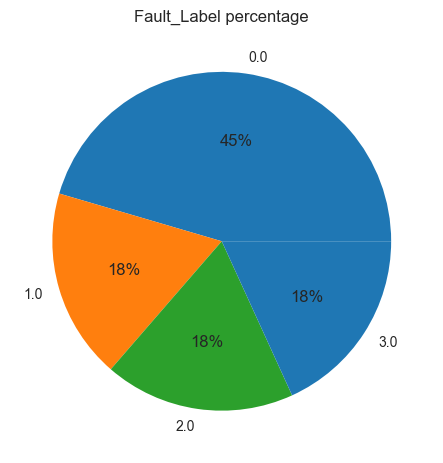

In [16]:
value = df['Fault_Label'].value_counts()
Type_percentage = 100*value/df.Fault_Label.shape[0]
labels = Type_percentage.index.array
x = Type_percentage.array
plt.pie(x, labels = labels, colors=sns.color_palette('tab10')[0:3], autopct='%.0f%%')
plt.title('Fault_Label percentage')
plt.show()

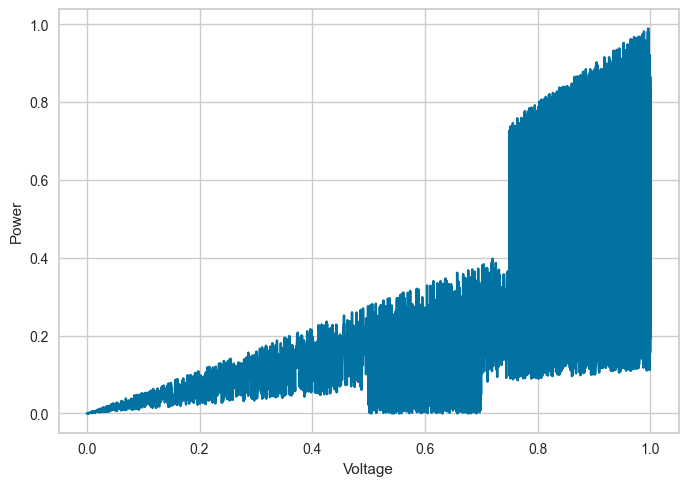

In [17]:
sns.lineplot(x="Voltage",y="Power",data=df)   
plt.show()

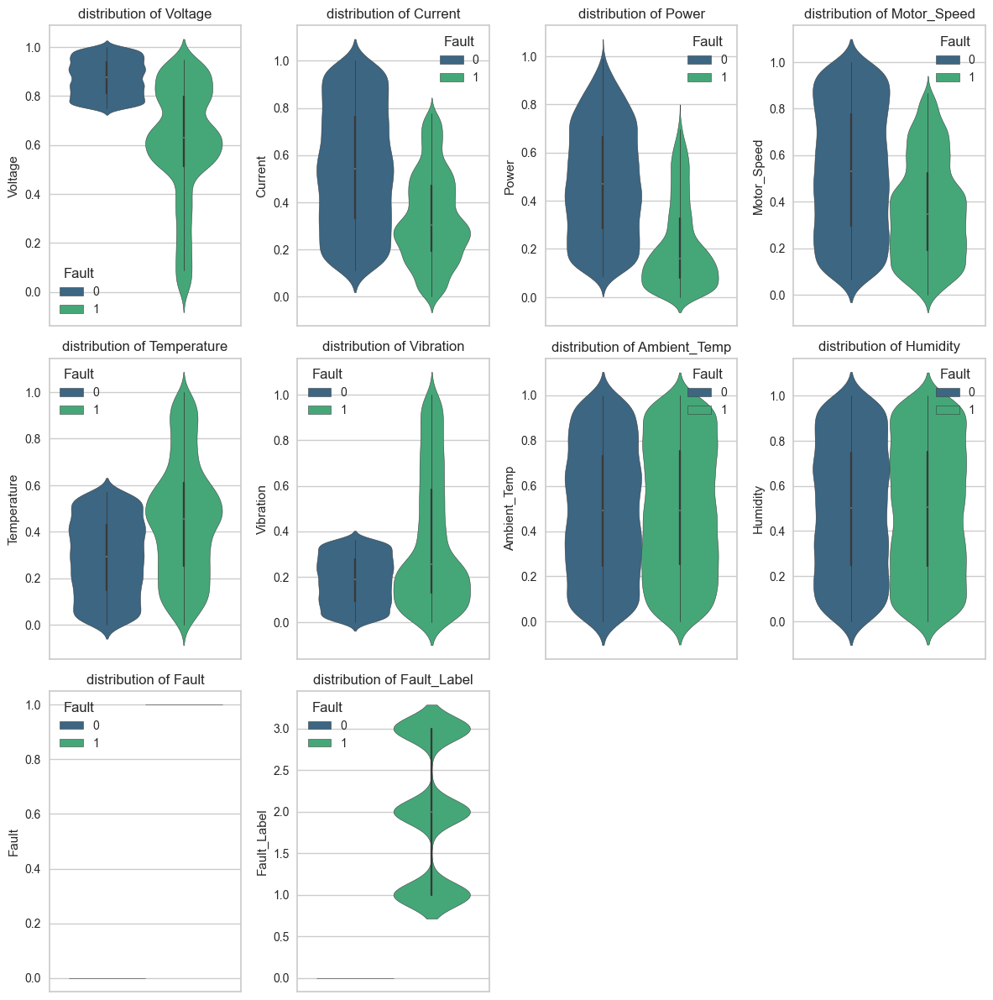

In [18]:

num_features = len(df.columns)
num_rows = (num_features + 1) // 2  
num_cols = 4 

plt.figure(figsize=(12, num_rows * 4))  
for i, column in enumerate(df.columns, 1):
    plt.subplot(num_rows, num_cols, i)
    sns.violinplot(y=column, data=df, palette='viridis',hue='Fault')
    plt.title(f'distribution of {column}')

plt.tight_layout()
plt.show()

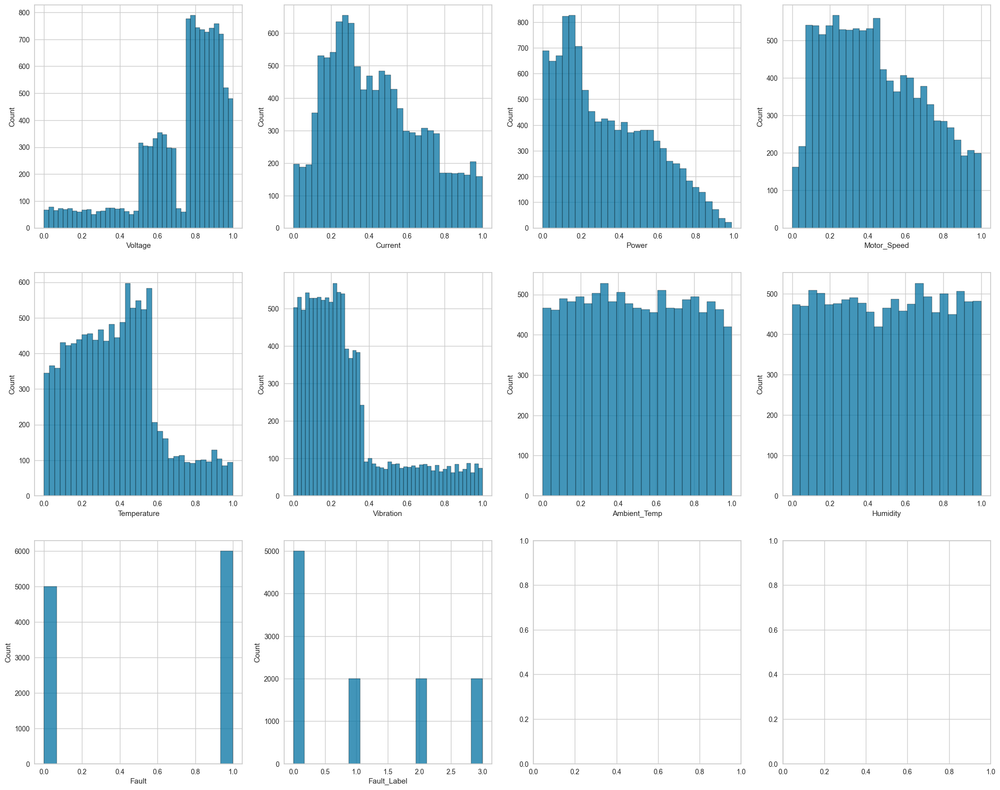

In [19]:
fig, ax = plt.subplots(3, 4, figsize=(25, 20))

for i, col in enumerate(df.columns):
    sns.histplot(df[col], ax=ax[i//4][i%4])

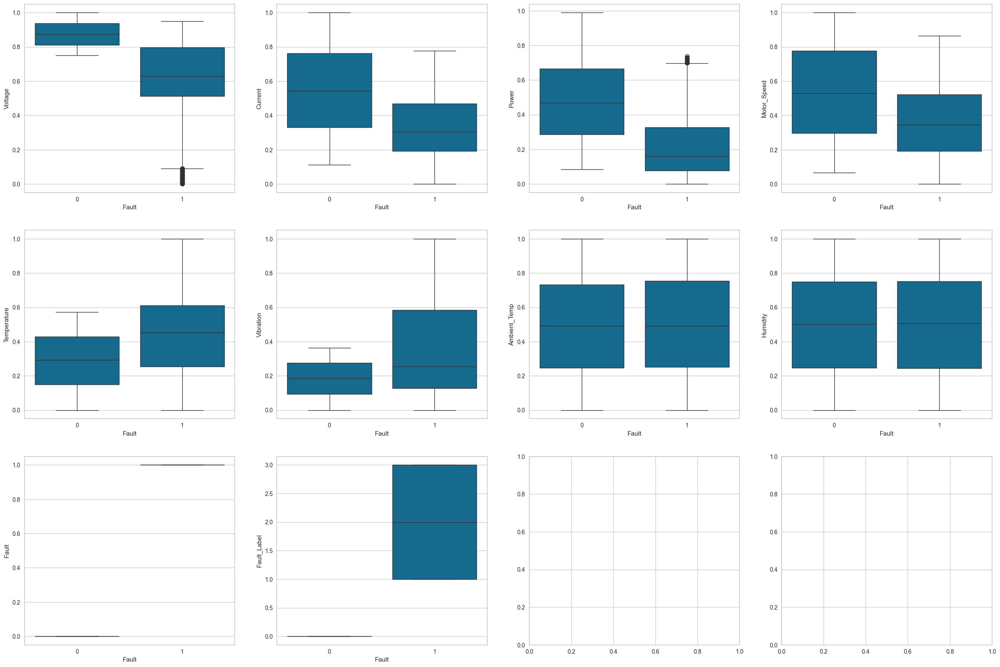

In [20]:
fig, ax = plt.subplots(3, 4, figsize=(30, 20))
for i, col in enumerate(df.columns):
    sns.boxplot(x="Fault", y=col, data=df, ax=ax[i//4][i%4])

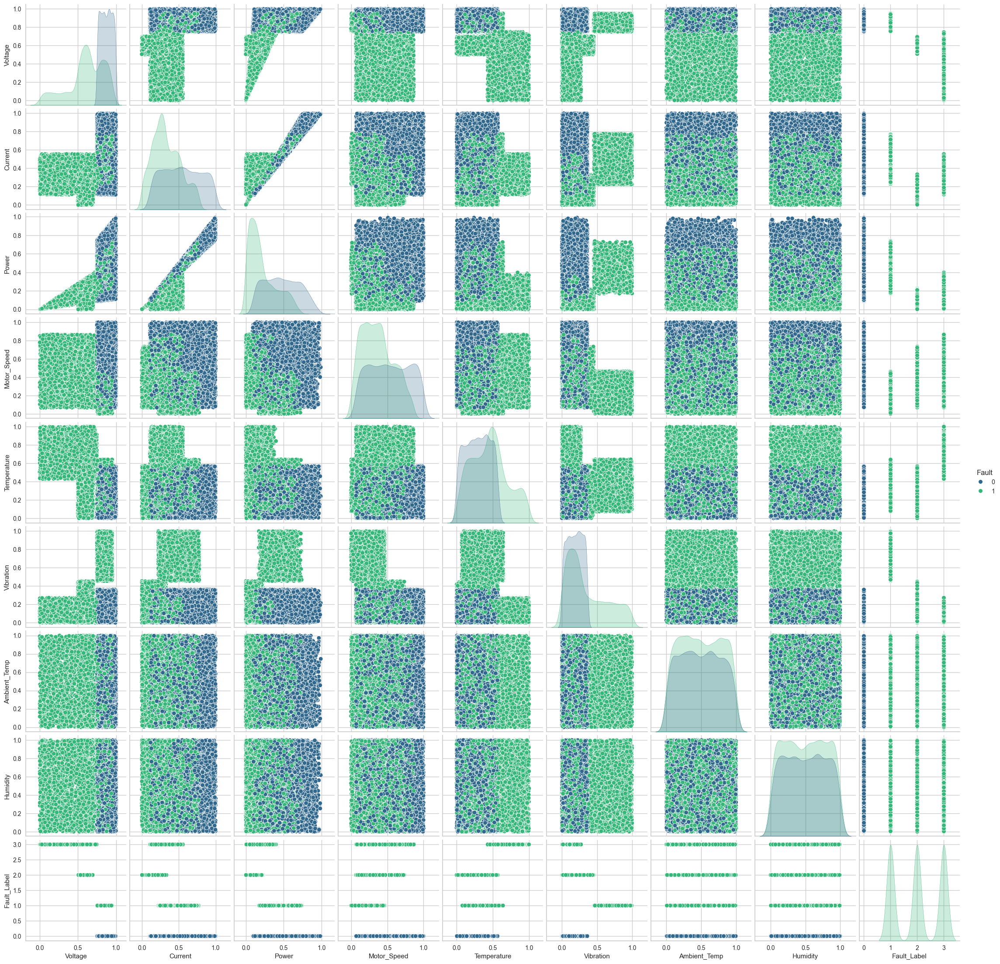

In [21]:
sns.pairplot(df, hue='Fault',palette='viridis')

<Axes: >

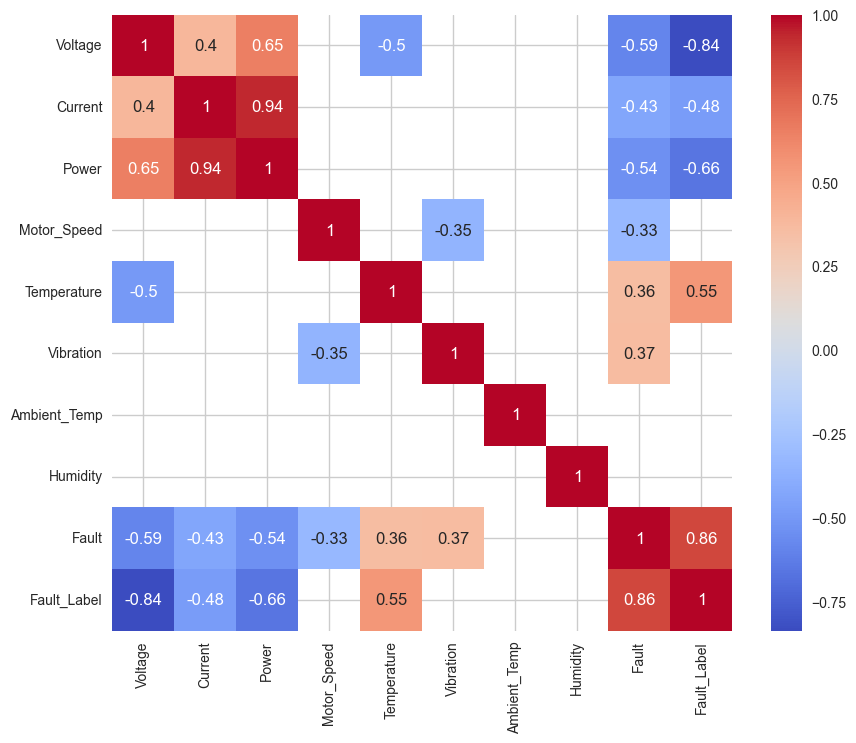

In [22]:
threshold = 0.3
correlation = df.corr()
matrix = correlation.where((abs(correlation) >= threshold)).isna()
plt.figure(figsize=(10, 8))
sns.heatmap(df.corr(), cmap="coolwarm", annot=True, mask=matrix)

Defining Outliers

In [23]:
df.drop('Fault_Label',axis=1,inplace=True)

In [24]:
excluded_columns = ['Fault']

model = LocalOutlierFactor(n_neighbors=5)

scores = model.fit_predict(df)

outliers = df[scores == -1]
if not outliers.empty:
    df.drop(outliers.index, inplace=True)

print(df.shape)

(11000, 9)


Unsupervised Models

K-Means Clustering

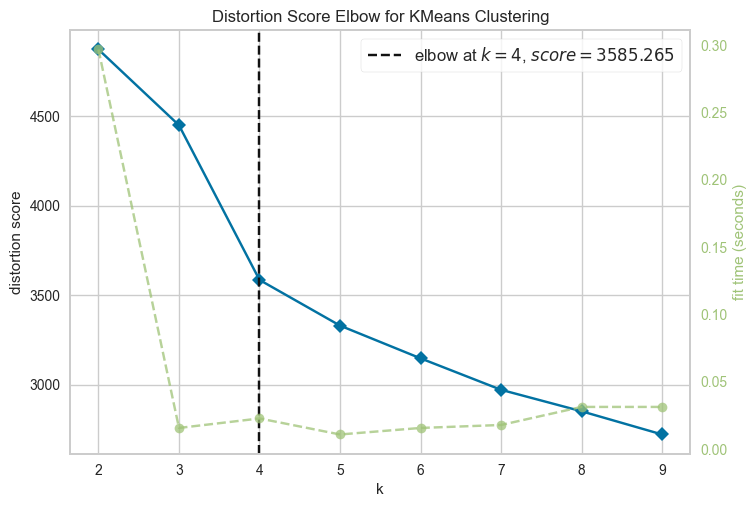

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [25]:
X=df[['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature',
       'Vibration', 'Ambient_Temp', 'Humidity', 'Fault']]

model = KMeans()

visualizer = KElbowVisualizer(model, k=(2,10)) # it turns out that k = 5 is the optimal number of clusters 

visualizer.fit(X)
visualizer.show()

<Figure size 1000x800 with 0 Axes>

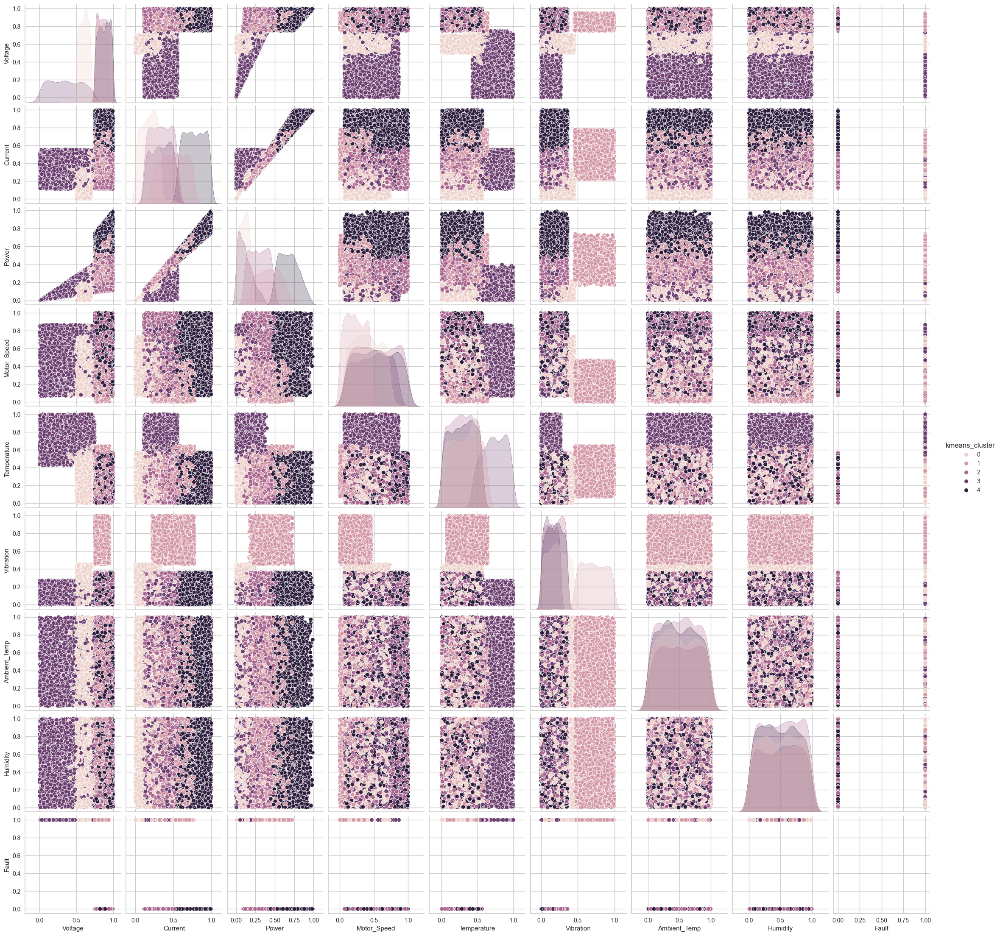

Silhouette Coefficient: 0.207


In [26]:
kmeans = KMeans(init="random",  n_clusters=5,
                n_init=10, max_iter=300, random_state=42)
kmeans.fit(X)

df["kmeans_cluster"] = kmeans.predict(X)

plt.figure(figsize=(10, 8))

# create a pairplot of the data, colored by cluster label
sns.pairplot(df, hue="kmeans_cluster", vars=['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature',
       'Vibration', 'Ambient_Temp', 'Humidity', 'Fault'])
plt.show()

score = silhouette_score(X, kmeans.predict(X))

print(f"Silhouette Coefficient: {score:.3f}")

Hierarchical clustering

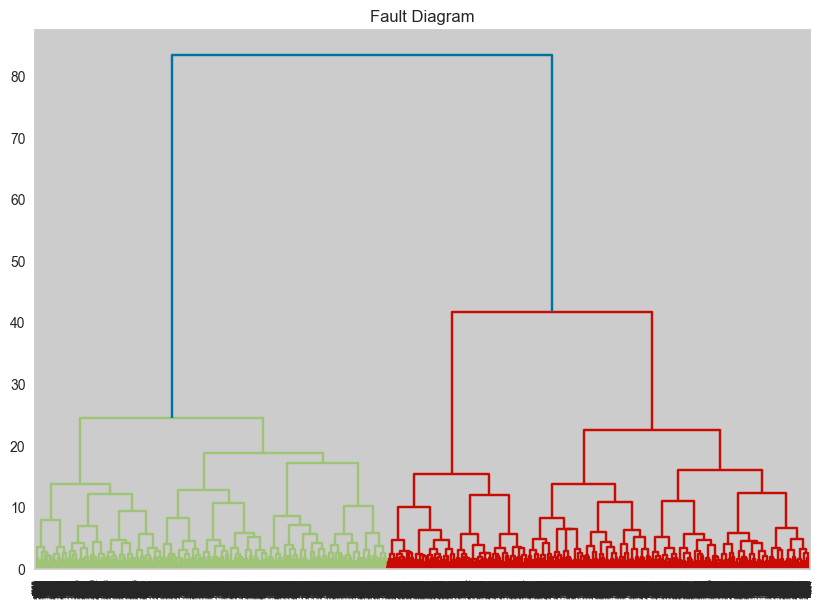

In [27]:
#dendogram
plt.figure(figsize=(10, 7))
plt.title("Fault Diagram")

clusters = shc.linkage(X, method='ward', metric="euclidean")
shc.dendrogram(Z=clusters)
plt.show()

# Hierarchical clustering
model = AgglomerativeClustering(n_clusters=3, metric='euclidean', linkage='ward')
model.fit(X)
df["hierarchical_cluster"] = model.labels_


<Figure size 1000x800 with 0 Axes>

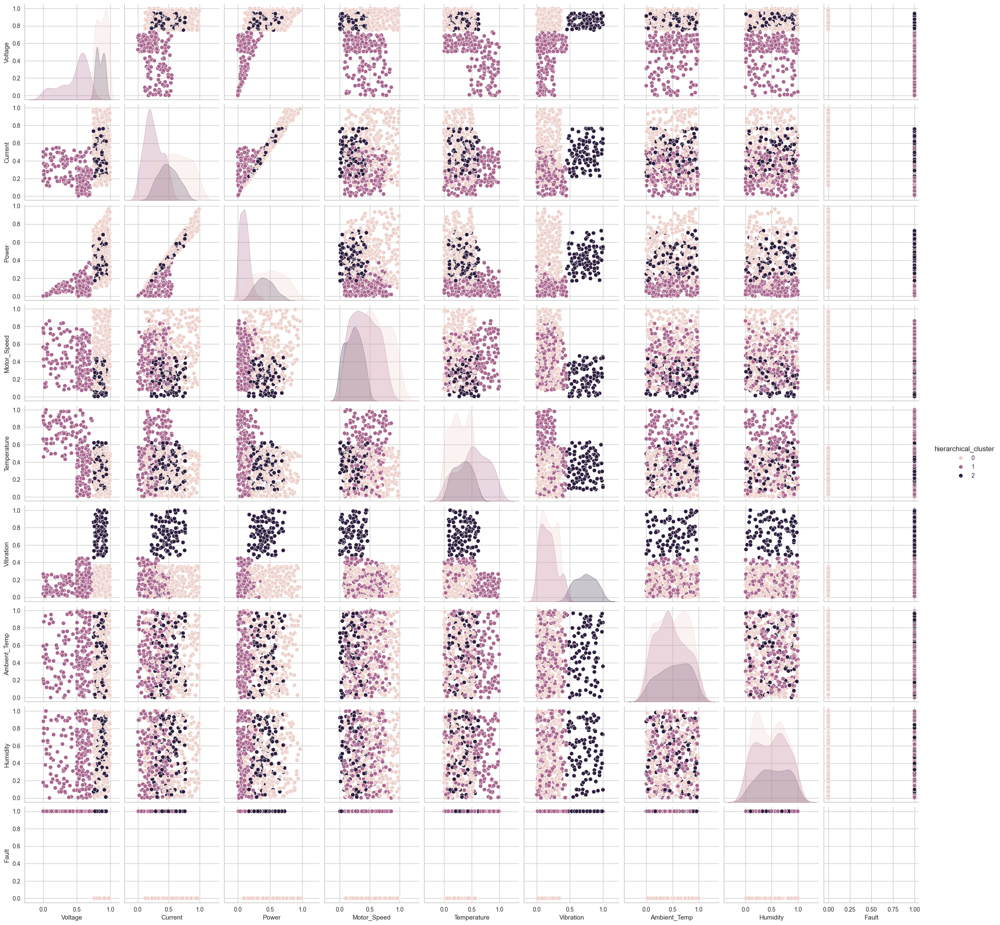

In [28]:
plt.figure(figsize=(10, 8))

# create a pairplot of the data
sns.pairplot(df.sample(frac=0.05), hue="hierarchical_cluster", vars=['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature',
       'Vibration', 'Ambient_Temp', 'Humidity', 'Fault'])
plt.show()

In [29]:
#silhouette coefficient
score = silhouette_score(X, df["hierarchical_cluster"])

print(f"Silhouette Coefficient: {score:.3f}")

Silhouette Coefficient: 0.333


Supervised Learning

Preparing train-test split

In [30]:
model_performance = pd.DataFrame(columns=['Accuracy', 'Precision',
                                          'Recall', 'F1-Score', 'Training time',
                                          'Prediction time'])

def log_scores(model_name, y_test, y_predictions):
    accuracy = accuracy_score(y_test, y_predictions)
    precision = precision_score(y_test, y_predictions, average='weighted')
    recall = recall_score(y_test, y_predictions, average='weighted')
    precision = precision_score(y_test, y_predictions, average='weighted')
    f1 = f1_score(y_test, y_predictions, average='weighted')

    model_performance.loc[model_name] = [accuracy, precision, recall, f1,
                                       end_train-start, end_predict-end_train]

In [31]:
X=df[['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature',
       'Vibration', 'Ambient_Temp', 'Humidity']]
y=df['Fault']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42,stratify=y)

To solve imbalanced training data we made oversample it's better than smote


In [32]:
oversample = SVMSMOTE(random_state = 42)

X_train, y_train = oversample.fit_resample(X_train, y_train)

Descision Tree Classifier

In [33]:
start = time.time()
model = DecisionTreeClassifier(max_depth = 9).fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

# evaluate the model
log_scores("Decision Tree", y_test, y_predictions)
print("Decision Tree\n" + classification_report(y_test, y_predictions))


Decision Tree
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      1.00      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



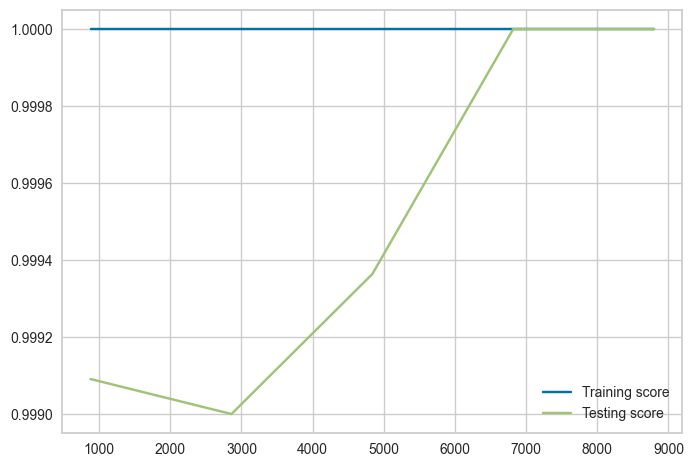

In [34]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

# plot the learning curve
plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

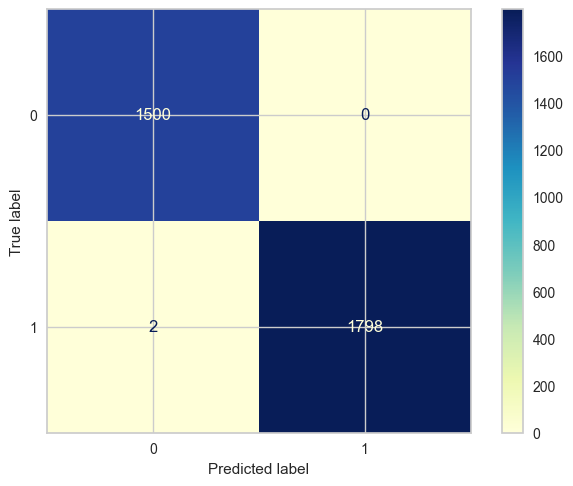

In [35]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

In [36]:
from sklearn.tree import export_text

rules = export_text(model)

print(rules)

|--- feature_0 <= 0.73
|   |--- feature_2 <= 0.40
|   |   |--- feature_0 <= 0.71
|   |   |   |--- feature_3 <= 0.87
|   |   |   |   |--- feature_0 <= 0.71
|   |   |   |   |   |--- feature_0 <= 0.69
|   |   |   |   |   |   |--- class: 1
|   |   |   |   |   |--- feature_0 >  0.69
|   |   |   |   |   |   |--- feature_0 <= 0.69
|   |   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |   |--- feature_0 >  0.69
|   |   |   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_0 >  0.71
|   |   |   |   |   |--- feature_3 <= 0.11
|   |   |   |   |   |   |--- class: 0
|   |   |   |   |   |--- feature_3 >  0.11
|   |   |   |   |   |   |--- class: 1
|   |   |   |--- feature_3 >  0.87
|   |   |   |   |--- class: 0
|   |   |--- feature_0 >  0.71
|   |   |   |--- feature_4 <= 0.42
|   |   |   |   |--- class: 0
|   |   |   |--- feature_4 >  0.42
|   |   |   |   |--- feature_3 <= 0.79
|   |   |   |   |   |--- feature_7 <= 0.93
|   |   |   |   |   |   |--- feature_3 <= 0.72
|   |   |   |   |

k-NN (K-nearest neighbors) Model


In [37]:
knn = KNeighborsClassifier()

param_grid = {'n_neighbors': range(2, 20)}

grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')

grid_search.fit(X_train, y_train)

print(grid_search.best_params_)

{'n_neighbors': 5}


In [38]:
start = time.time()
model = KNeighborsClassifier(n_neighbors=5).fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test) 
end_predict = time.time()

log_scores("k-NN", y_test, y_predictions)

In [39]:
print("k-NN Model\n" + classification_report(y_test, y_predictions))


k-NN Model
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      1500
           1       0.99      0.98      0.99      1800

    accuracy                           0.98      3300
   macro avg       0.98      0.98      0.98      3300
weighted avg       0.98      0.98      0.98      3300



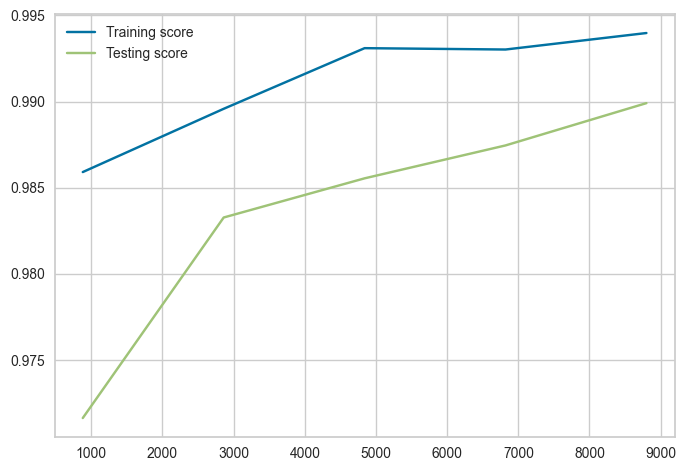

In [40]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

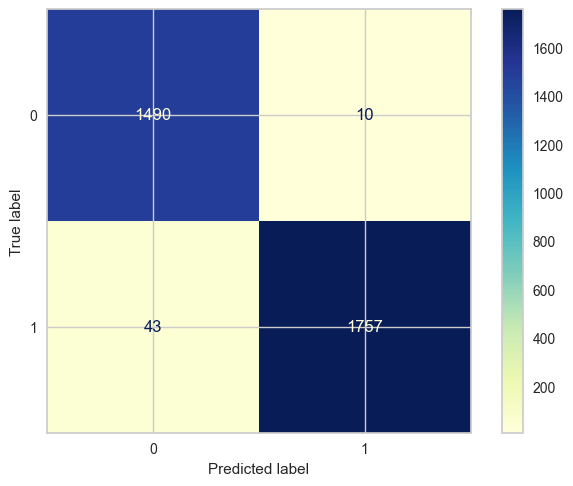

In [41]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

Logistic Regression Model


In [42]:
start = time.time()
model = LogisticRegression().fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("Logistic Regression", y_test, y_predictions)

In [43]:
print("Logistic Regression\n" + classification_report(y_test, y_predictions))

Logistic Regression
              precision    recall  f1-score   support

           0       0.94      0.97      0.96      1500
           1       0.98      0.95      0.96      1800

    accuracy                           0.96      3300
   macro avg       0.96      0.96      0.96      3300
weighted avg       0.96      0.96      0.96      3300



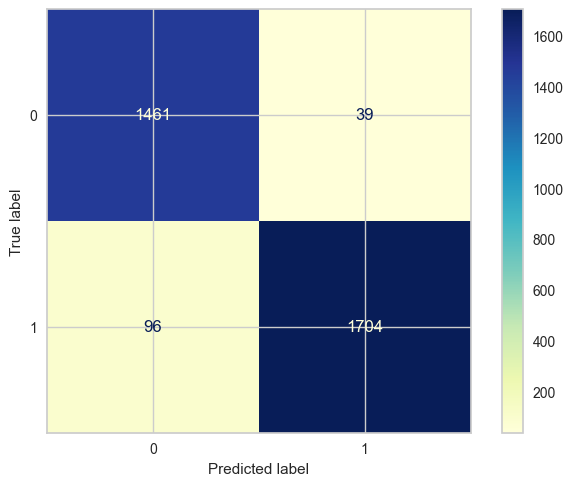

In [44]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

Random Forest Model

In [45]:
start = time.time()
model = RandomForestClassifier(n_estimators=100, n_jobs=-1,
                               random_state=0, bootstrap=True).fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("Random Forest", y_test, y_predictions)

In [46]:
print("Random Forest Model\n" + classification_report(y_test, y_predictions))

Random Forest Model
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      1.00      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



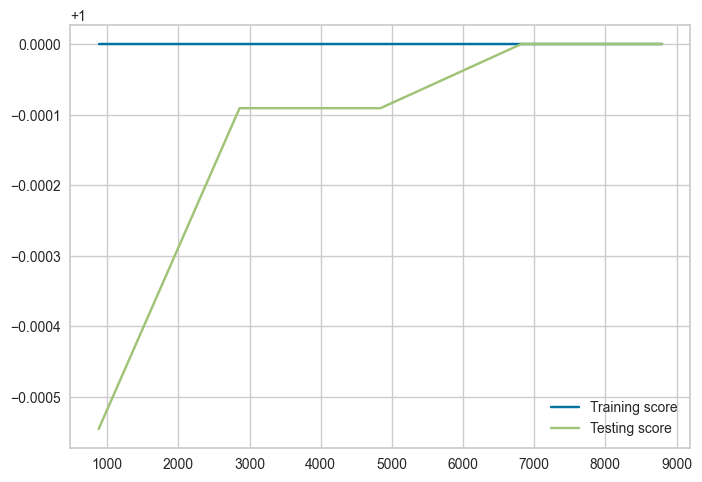

In [47]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

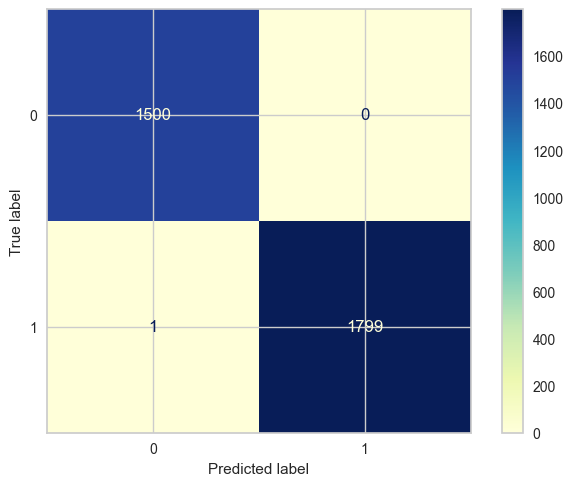

In [48]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

Gradient Boosting Model


In [49]:
start = time.time()
model = GradientBoostingClassifier().fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("Gradient Boosting", y_test, y_predictions)

In [50]:
print("Gradient Boosting\n" + classification_report(y_test, y_predictions))

Gradient Boosting
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      1.00      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



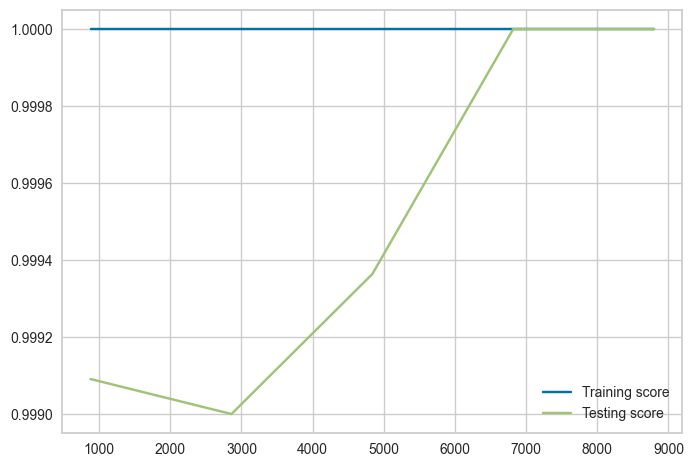

In [51]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

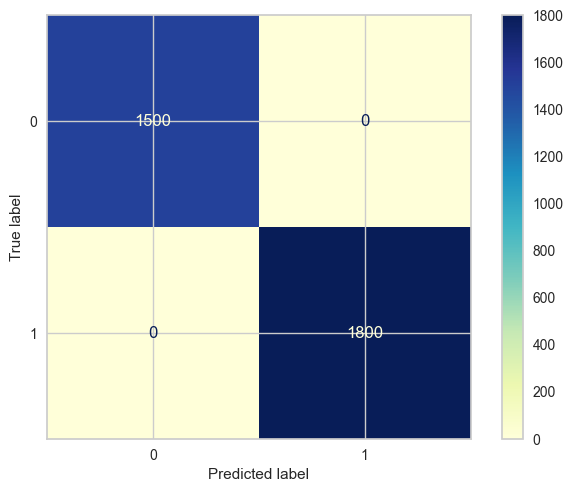

In [52]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu) 

XGBOOST Model

In [53]:
start = time.time()
model = xgb.XGBClassifier().fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("XGBOOST Model", y_test, y_predictions)

In [54]:
print("XGBOOST Model\n" + classification_report(y_test, y_predictions))

XGBOOST Model
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      1.00      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



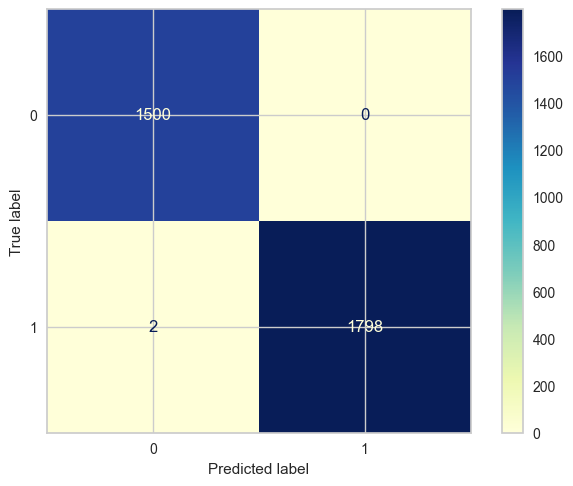

In [55]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

SVC SUPPORT VECTOR CLASSIFIER

In [56]:
start = time.time()
model = SVC().fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("SVC", y_test, y_predictions)

In [57]:
print("SVC\n" + classification_report(y_test, y_predictions))

SVC
              precision    recall  f1-score   support

           0       0.99      1.00      1.00      1500
           1       1.00      0.99      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



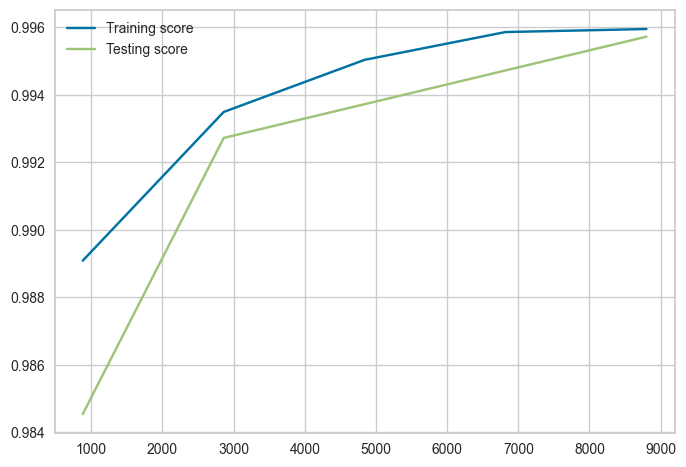

In [58]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

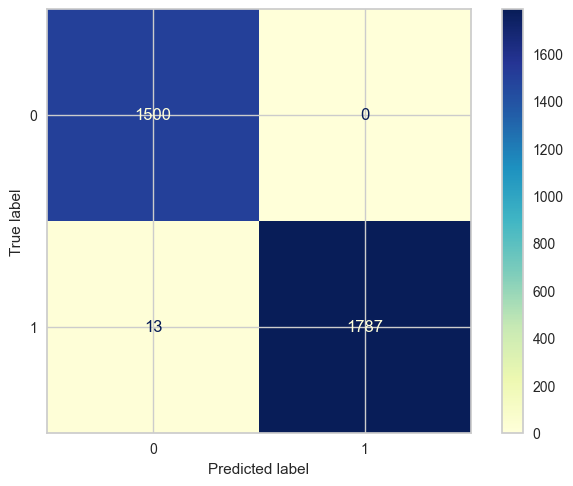

In [59]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

Gaussian Naive Bayes Model

In [60]:
start = time.time()
model = GaussianNB().fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("Gaussian Naive Bayes", y_test, y_predictions)

In [61]:
print("Gaussian Naive Bayes\n" + classification_report(y_test, y_predictions))

Gaussian Naive Bayes
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      1500
           1       0.96      0.98      0.97      1800

    accuracy                           0.97      3300
   macro avg       0.97      0.97      0.97      3300
weighted avg       0.97      0.97      0.97      3300



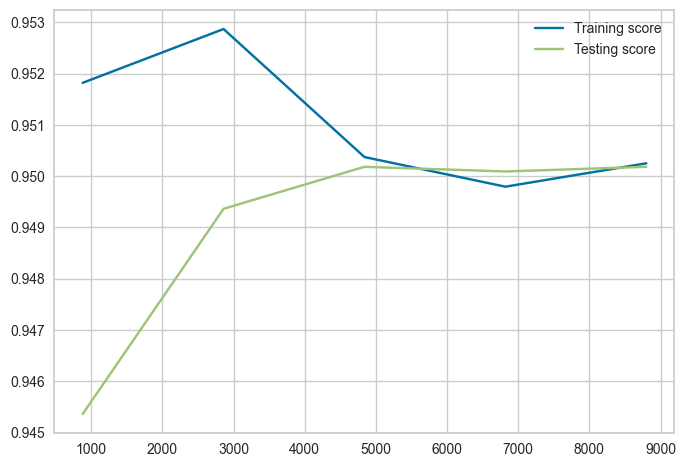

In [62]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

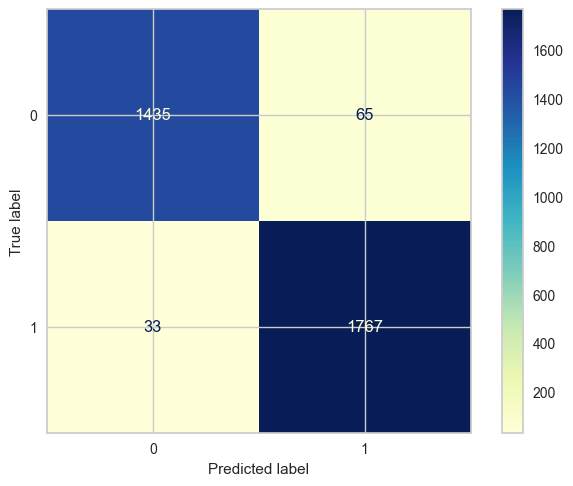

In [63]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu)  

MLP (Multi-layer Perceptron) Model

In [64]:
start = time.time()
model = MLPClassifier(random_state=1, max_iter=600, learning_rate="invscaling").fit(X_train, y_train)
end_train = time.time()
y_predictions = model.predict(X_test)
end_predict = time.time()

log_scores("Multi-layer Perceptron", y_test, y_predictions)

In [65]:
print("Multi-layer Perceptron\n" + classification_report(y_test, y_predictions))

Multi-layer Perceptron
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      1500
           1       1.00      1.00      1.00      1800

    accuracy                           1.00      3300
   macro avg       1.00      1.00      1.00      3300
weighted avg       1.00      1.00      1.00      3300



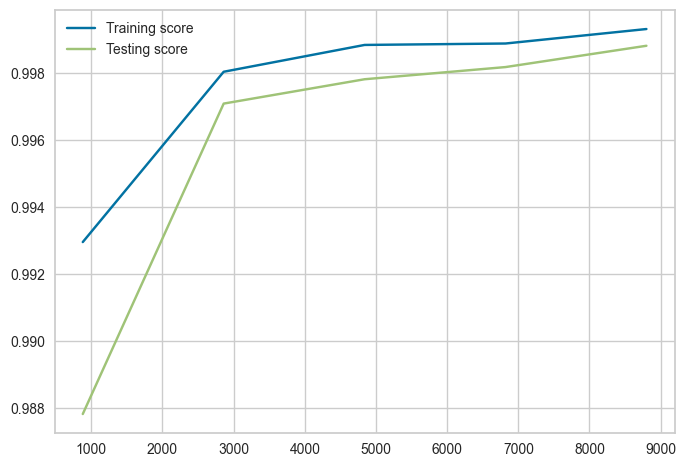

In [66]:
train_sizes, train_scores, test_scores = learning_curve(model, X, y, cv=5)

plt.plot(train_sizes, train_scores.mean(axis=1), label='Training score')
plt.plot(train_sizes, test_scores .mean(axis=1), label='Testing score')
plt.legend(loc='best')
plt.show()

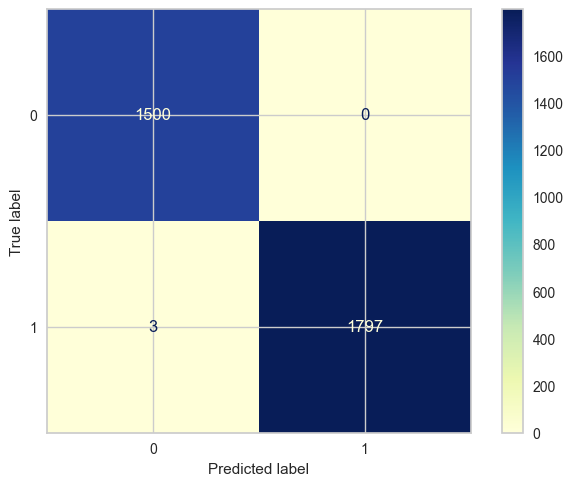

In [67]:
ConfusionMatrixDisplay.from_predictions(y_test, y_predictions, cmap=plt.cm.YlGnBu) 

Evaluation

In [68]:
model_performance.sort_values(by='Accuracy', ascending=False)


,Accuracy,Precision,Recall,F1-Score,Training time,Prediction time
Gradient Boosting,1.000000,1.000000,1.000000,1.000000,3.214927,0.000269
Random Forest,0.999697,0.999697,0.999697,0.999697,0.344933,0.027591
Decision Tree,0.999394,0.999395,0.999394,0.999394,0.048589,0.000000
XGBOOST Model,0.999394,0.999395,0.999394,0.999394,0.716283,0.015620
Multi-layer Perceptron,0.999091,0.999093,0.999091,0.999091,5.915920,0.000000
SVC,0.996061,0.996094,0.996061,0.996062,0.266111,0.244098
k-NN,0.983939,0.984163,0.983939,0.983952,0.018678,0.248361
Gaussian Naive Bayes,0.970303,0.970429,0.970303,0.970274,0.013155,0.000000
Logistic Regression,0.959091,0.959769,0.959091,0.959143,0.030070,0.000000


Saving Model and making Predictions

In [69]:
model = DecisionTreeClassifier(max_depth = 8)
model.fit(X_train, y_train)

with open('DTC.pkl', 'wb') as file:
    pickle.dump(model, file)


Cross-val scores

In [70]:
model = DecisionTreeClassifier(max_depth = 9).fit(X_train, y_train)

In [71]:
cv_rc=cross_val_score(model,X,y,cv=5,scoring='recall')
print("cross-validation recall" ,np.mean(cv_rc))
cv_acc=cross_val_score(model,X,y,cv=5,scoring='accuracy')
print("cross-validation accruacy ",np.mean(cv_acc))
cv_f1=cross_val_score(model,X,y,cv=5,scoring='f1')
print("cross-validation f1: ",np.mean(cv_f1))
cv_prec=cross_val_score(model,X,y,cv=5,scoring='precision')
print("cross-validation precision: ",np.mean(cv_prec))

cross-validation recall 1.0
cross-validation accruacy  1.0
cross-validation f1:  1.0
cross-validation precision:  1.0


0.9993939393939394
[[1500    0]
 [   2 1798]]


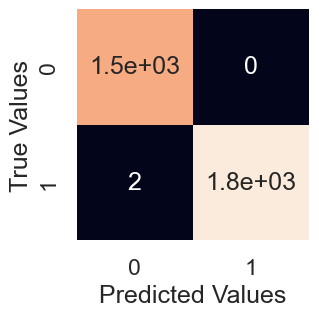

In [72]:
print(model.score(X_test, y_test))
y_pred=model.predict(X_test)

print(confusion_matrix(y_test,y_pred))
sns.set_theme(font_scale=1.5)
fig, ax = plt.subplots(figsize=(3,3))
ax = sns.heatmap(confusion_matrix(y_test, y_pred),
                     annot=True,
                     cbar=False)
plt.xlabel("Predicted Values")
plt.ylabel("True Values")
plt.show()

In [73]:
#Randomgridsearch CV and model tuning, model score is decreased after tuning therefore we will use the model without tuning
rand_params = {        "max_depth": [None, 5, 10], 
                       "min_samples_split": np.arange(5, 20, 5), 
                       "min_samples_leaf": np.arange(1, 10, 2) }
rs_rf = RandomizedSearchCV(model,param_distributions=rand_params,cv=5,verbose=True,
return_train_score=True,n_iter=10,scoring='accuracy')
model_tuned=rs_rf.fit(X_train,y_train)
print('Best hyper parameter:', rs_rf.best_params_)
print("Score after tuning:", model_tuned.score(X_test,y_test))

Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best hyper parameter: {'min_samples_split': np.int64(5), 'min_samples_leaf': np.int64(9), 'max_depth': None}
Score after tuning: 0.9984848484848485


In [74]:
feature_importances = model.feature_importances_

importance_df = pd.DataFrame({
    'Feature': X.columns,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

print(importance_df)

        Feature  Importance
5     Vibration    0.505214
0       Voltage    0.478056
4   Temperature    0.011841
1       Current    0.002353
3   Motor_Speed    0.001855
2         Power    0.000476
7      Humidity    0.000205
6  Ambient_Temp    0.000000


Online prediction


In [75]:
model_file = 'DTC.pkl'

with open(model_file, 'rb') as file:
    model = pickle.load(file)


In [76]:
df.columns

Index(['Voltage', 'Current', 'Power', 'Motor_Speed', 'Temperature',
       'Vibration', 'Ambient_Temp', 'Humidity', 'Fault', 'kmeans_cluster',
       'hierarchical_cluster'],
      dtype='object')

In [77]:
def predict(Voltage, Current, Power, Motor_Speed, Temperature, Vibration, Ambient_Temp, Humidity):

    temp = [{ 'Voltage': Voltage,
             'Current': Current, 'Power': Power,
             'Motor_Speed': Motor_Speed, 'Temperature': Temperature,
             'Vibration': Vibration, 'Ambient_Temp': Ambient_Temp, 'Humidity': Humidity}]

    input_data = pd.DataFrame(temp) 
    prediction = model.predict_proba(input_data)

    classes = ["No failure", "Machine failure"]
    prediction_dict = {}
    for record in prediction:
        prediction_dict = {classes[i] : record[i] for i in range(2)}
    
    maintenance = "No action required"
    if max(prediction_dict, key=prediction_dict.get) != "No failure":
        maintenance = "Need maintenance"

    return prediction_dict, maintenance

# create the user interface (inputs and outputs)
demo = gr.Interface(
    fn=predict,
    inputs=[gr.Slider(0, 1, label="Voltage"),
            gr.Slider(0, 1, label="Current"),
            gr.Slider(0, 1, label="Power"),
            gr.Slider(0, 1, label="Motor Speed"),
            gr.Slider(0, 1, label="Temperature"),
            gr.Slider(0, 1, label="Vibration"),
            gr.Slider(0, 1, label="Ambient Temp"),
            gr.Slider(0, 1, label="Humidity")],
    outputs=[gr.Label(num_top_classes=2, label="Result"), gr.Textbox(label="Action")]
)
demo.launch()

* Running on local URL:  http://127.0.0.1:7860

To create a public link, set `share=True` in `launch()`.
